In [2]:
options(warn=-1)
#install.packages('runjags')
#install.packages('gridExtra')
library(tidyverse)
library(coda)
library(grid)
library(gridExtra)
# library(rjags)
# library(runjags)

# Exercise 1

• given the following un-normalized posterior distribution draw a Markov Chain from the posterior distribution using a Metropolis-Hastings algorithm

• use a Norm (0, 1) as random-walk candidate density

• plot the sampled distribution

• analyze the chain with the CODA package and plot the chain autocorrelation

• try to use different burn-in cycles and thinning and plot the corresponding posterior distribution
and the chain autocorrelation function. What are the best parameters ?

In [3]:
iter.coda = function(mean, sig, burn.in=0, thinning=1){
    target.post = function(theta){
        res = 0.5 * exp( -0.5*(theta + 3)^2) + 0.5 * exp( -0.5*(theta - 3)^2 )
        return(res)
    }

    log10.func <- function(theta){
        return(log10( target.post(theta)))
    }

    # Parameters :
    # func : a function whose first argument is a real vector of parameters
    # func returns a log10 of the likelihood function
    # theta.init : the initial value of the Markov Chain (and of func)
    # n.sample: number of required samples
    # sigma : standar deviation of the gaussian MCMC sampling pdf

    metropolis.1dim <- function(func , theta.init , n.sample , mean, sigma, burn.in, thinning){
        theta.cur <- theta.init
        func.Cur <- func(theta.cur)
        func.Samp <- matrix(data=NA , nrow=n.sample-burn.in , ncol=2+1)
        n.accept <- 0
        rate.accept <- 0.0
        for (n in 1:n.sample) {

            theta.prop <- rnorm(n=1, mean = theta.cur , sigma)
            func.Prop <- func(theta.prop)
            logMR <- func.Prop - func.Cur # Log10 of the Metropolis ratio

            if ( logMR >=0 || logMR >log10(runif(1)) ) {

                theta.cur <- theta.prop
                func.Cur <- func.Prop
                n.accept <- n.accept + 1
            }
            
            if (n>burn.in){
                func.Samp[n-burn.in, 1] <- func.Cur
                func.Samp[n-burn.in, 2] <- theta.cur
            }
        }
        
        col1 = func.Samp[, 1][seq(1, length(func.Samp[, 1]), by=thinning)]
        col2 = func.Samp[, 2][seq(1, length(func.Samp[, 2]), by=thinning)]
        
        func.Samp = matrix(data=c(col1, col2), ncol=2)
        return(func.Samp)
    }

    theta.init <- -5
    sample.sig <- sig
    n.sample <- 10^5

    set.seed(1)

    chain <- metropolis.1dim(func=log10.func,
                              theta.init=theta.init,
                              n.sample=n.sample,
                              mean = mean,
                              sigma=sample.sig^2,
                              burn.in = burn.in,
                              thinning = thinning)

    dtheta = 0.001
    theta = seq(-10, 10, dtheta)
    y  = target.post(theta) / sum(target.post(theta)*dtheta)

    c.chain1 <- as.mcmc(chain[,2])
    my.lags = seq(0,500,10)
    y1 <- autocorr(c.chain1, lags=my.lags)

    p1 = ggplot()+
    geom_line(aes(x=theta, y=y, color='Target Posterior'))+
    stat_bin(aes(x=chain[,2],y=..density..,color = 'MCMC sampling'),
             linetype='dashed',
             geom="step",
             linewidth=0.7,
             breaks=seq(from=min(theta),to=max(theta),length.out=100))+
    labs(title=paste0('Burn.in = ', burn.in, ' Thinning= ', thinning, ' Sigma = ', sig), x='theta', y='Probability')+
    scale_color_brewer(palette="Dark2")

    p2 = ggplot() + geom_point(aes(x = my.lags, y = y1))+
    labs(title=paste0('Autocorrelation function, Effective size =', sprintf('%.2f',effectiveSize(c.chain1))), x = 'lags', y = 'AEF')
    options(repr.plot.width = 10, repr.plot.height =3)
    arrangeGrob(grobs=list(p1,p2), nrow=1)
}

In [4]:
burn.in = c(1, 10, 30, 50)
thinning = c(1, 5, 10, 25)

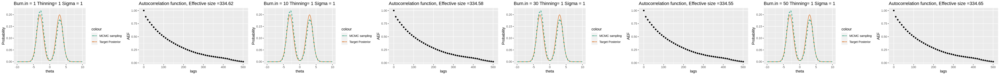

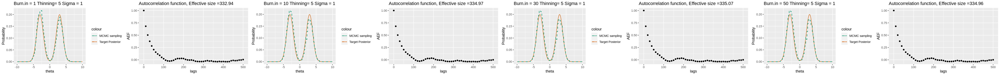

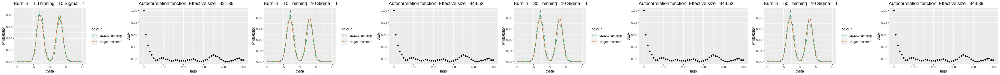

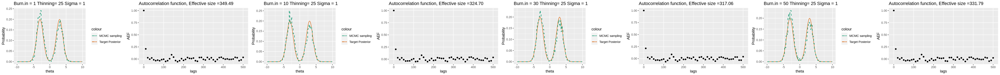

In [5]:
for (t in thinning){
    plots = lapply(burn.in, function(.burn.in){iter.coda(mean=NA, sig=1, burn.in=.burn.in, thinning=t)})
    options(repr.plot.width = 40, repr.plot.height =3)
    do.call(grid.arrange, c(grobs=plots, nrow=1))
}

# Exercise 2

## Jcovden (Janssen)

Data from EMA

In [2]:
n_vaccine <- 19630
n_placebo <- 19691
patient <- c(rep(" Vaccine ", n_vaccine ),
rep(" Placebo ", n_placebo ))
# Number of patients tested postive after RCT:
p_vaccine <- 116
p_placebo <- 348
tested <- c(rep("Pos", p_vaccine ),
            rep("Neg", n_vaccine - p_vaccine ),
            rep("Pos", p_placebo ),
            rep("Neg", n_placebo - p_placebo ))
Jcovden.tb <- tibble( tested = tested , patient = patient )
table( Jcovden.tb[[2]], Jcovden.tb[[1]])

           
              Neg   Pos
   Placebo  19343   348
   Vaccine  19514   116

JAGS model 

In [3]:
modelString <- "
    model {
        for ( i in 1:Ntot ) {
            tested[i]~dbern( theta[ patient [i]] )
        }
        for ( k in 1: Nclass ) {
            theta[k]~dbeta(3 , 100)
        }
    }"

dataList = list(tested = ifelse(Jcovden.tb$tested == "Neg", 0, 1),
                patient = as.integer ( factor (Jcovden.tb$patient )),
                Ntot = nrow(Jcovden.tb),
                Nclass = nlevels(factor(Jcovden.tb$patient )))

Jcovden_chains <- run.jags(modelString ,
                           sample = 15000,
                           n.chains = 4,
                           method = "parallel",
                           monitor = "theta",
                           data = dataList )

Calling 4 simulations using the parallel method...
Following the progress of chain 1 (the program will wait for all chains
to finish before continuing):
Welcome to JAGS 4.1.0 on Wed May 31 14:21:59 2023
JAGS is free software and comes with ABSOLUTELY NO WARRANTY
Loading module: basemod: ok
Loading module: bugs: ok
. . Reading data file data.txt
. Compiling model graph
   Resolving undeclared variables
   Allocating nodes
Graph information:
   Observed stochastic nodes: 39321
   Unobserved stochastic nodes: 2
   Total graph size: 78650
. Reading parameter file inits1.txt
. Initializing model
. Adaptation skipped: model is not in adaptive mode.
. Updating 4000
-------------------------------------------------| 4000
************************************************** 100%
. . Updating 15000
-------------------------------------------------| 15000
************************************************** 100%
. . . . Updating 0
. Deleting model
. 
All chains have finished
Note: the model did not r

In [4]:
summary(Jcovden_chains)

,Lower95,Median,Upper95,Mean,SD,Mode,MCerr,MC%ofSD,SSeff,AC.10,psrf
theta[1],0.01591470,0.017726650,0.01954850,0.01773788,0.0009289721,NA,4.644860e-06,0.5,40000,0.0062018189,1.0000406
theta[2],0.00494968,0.006012555,0.00710556,0.00603065,0.0005512422,NA,2.771691e-06,0.5,39554,-0.0005912681,0.9999775


The vaccine efficancy obtain from a Randomized controlled trials (RCTs) is obtained as the percentile reduction in the frequency of illness among vaccinated peolple compared to people not vaccinated. In this example it is gonna refered as the differential rate.

In [5]:
chain_Jcovden.df <- as.data.frame(as.mcmc(Jcovden_chains))

#adding the differential rate (the efficancy of the vaccine)
Jcovden_res <-  chain_Jcovden.df %>% 
                select('theta[1]','theta[2]') %>%
                rename ( Placebo = 'theta[1]', Vaccine = 'theta[2]') %>%
                mutate (diff_rate = (( Placebo - Vaccine ) / Placebo) * 100,
                Placebo_perc = Placebo * 100,
                Vaccine_perc = Vaccine * 100)

allmcmc2_Jcovden <- as.mcmc(Jcovden_res[, 'diff_rate'])
summary(allmcmc2_Jcovden)


Iterations = 1:60000
Thinning interval = 1 
Number of chains = 1 
Sample size per chain = 60000 

1. Empirical mean and standard deviation for each variable,
   plus standard error of the mean:

          Mean             SD       Naive SE Time-series SE 
      65.90135        3.59680        0.01468        0.01468 

2. Quantiles for each variable:

 2.5%   25%   50%   75% 97.5% 
58.42 63.57 66.05 68.39 72.48 


In [45]:
str(summary(allmcmc2_Jcovden))
summary(allmcmc2_Jcovden)$quantiles[['2.5%']]

List of 6
 $ statistics: Named num [1:4] 65.9013 3.5968 0.0147 0.0147
  ..- attr(*, "names")= chr [1:4] "Mean" "SD" "Naive SE" "Time-series SE"
 $ quantiles : Named num [1:5] 58.4 63.6 66 68.4 72.5
  ..- attr(*, "names")= chr [1:5] "2.5%" "25%" "50%" "75%" ...
 $ start     : num 1
 $ end       : num 60000
 $ thin      : num 1
 $ nchain    : num 1
 - attr(*, "class")= chr "summary.mcmc"


[1] 58.41774

In [46]:
mean.Jcodven = summary(allmcmc2_Jcovden)$statistics[['Mean']]
lw.Jcodven = summary(allmcmc2_Jcovden)$quantiles[['2.5%']]
up.Jcodven = summary(allmcmc2_Jcovden)$quantiles[['97.5%']]

Don't know how to automatically pick scale for object of type data.frame. Defaulting to continuous.


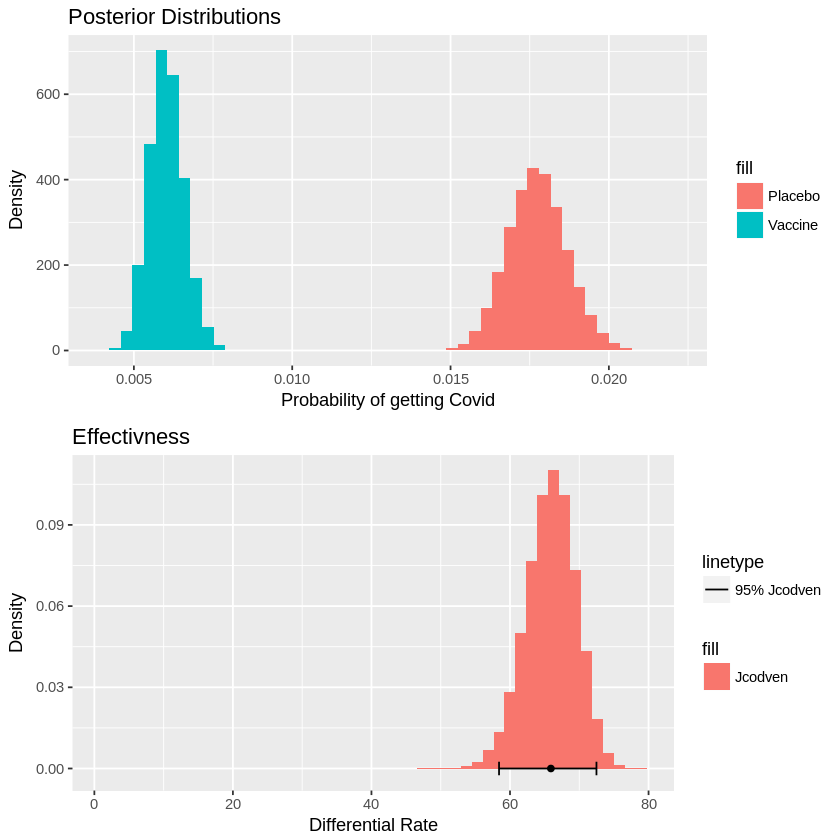

In [48]:
ggplot() +
geom_histogram(aes(x=chain_Jcovden.df['theta[1]'], y=..density.., fill='Placebo'), bins=50) +
labs(x='Probability of getting Covid', y='Density', title='Posterior Distributions')+
geom_histogram(aes(x=chain_Jcovden.df['theta[2]'], y=..density.., fill='Vaccine'), bins=50) -> Post.plot

ggplot()+
geom_histogram(aes(x=Jcovden_res$diff_rate, y=..density.., fill='Jcodven'), bins = 50)+
geom_errorbarh(aes(xmin=lw.Jcodven, xmax=up.Jcodven, y=0, x=1, linetype='95% Jcodven'),  size=0.5, height = .005)+
geom_point(aes(x=mean.Jcodven, y= 0))+
labs(x ='Differential Rate', y='Density', title='Effectivness') -> Differential_rate_Jcovden

grid.arrange(Post.plot, Differential_rate_Jcovden, nrow=2)

## Moderna (Spikevax)

Data from EMA

In [13]:
n_vaccine <- 14134
n_placebo <- 14073
patient <- c(rep(" Vaccine ", n_vaccine ),
rep(" Placebo ", n_placebo ))
# Number of patients tested postive after RCT:
p_vaccine <- 11
p_placebo <- 185
tested <- c(rep("Pos", p_vaccine ),
            rep("Neg", n_vaccine - p_vaccine ),
            rep("Pos", p_placebo ),
            rep("Neg", n_placebo - p_placebo ))
Moderna.tb <- tibble( tested = tested , patient = patient )
table( Moderna.tb[[2]], Moderna.tb[[1]])

           
              Neg   Pos
   Placebo  13888   185
   Vaccine  14123    11

JAGS model 

In [14]:
modelString <- "
    model {
        for ( i in 1:Ntot ) {
            tested[i]~dbern( theta[ patient [i]] )
        }
        for ( k in 1: Nclass ) {
            theta[k]~dbeta(3 , 100)
        }
    }"

dataList = list(tested = ifelse(Moderna.tb$tested == "Neg", 0, 1),
                patient = as.integer (factor(Moderna.tb$patient )),
                Ntot = nrow(Moderna.tb),
                Nclass = nlevels(factor(Moderna.tb$patient )))

Moderna_chains <- run.jags(modelString,
                           sample = 15000,
                           n.chains = 4,
                           method = "parallel",
                           monitor = "theta",
                           data = dataList )

Calling 4 simulations using the parallel method...
Following the progress of chain 1 (the program will wait for all chains
to finish before continuing):
Welcome to JAGS 4.1.0 on Wed May 31 14:28:55 2023
JAGS is free software and comes with ABSOLUTELY NO WARRANTY
Loading module: basemod: ok
Loading module: bugs: ok
. . Reading data file data.txt
. Compiling model graph
   Resolving undeclared variables
   Allocating nodes
Graph information:
   Observed stochastic nodes: 28207
   Unobserved stochastic nodes: 2
   Total graph size: 56422
. Reading parameter file inits1.txt
. Initializing model
. Adaptation skipped: model is not in adaptive mode.
. Updating 4000
-------------------------------------------------| 4000
************************************************** 100%
. . Updating 15000
-------------------------------------------------| 15000
************************************************** 100%
. . . . Updating 0
. Deleting model
. 
All chains have finished
Note: the model did not r

In [15]:
summary(Moderna_chains)

,Lower95,Median,Upper95,Mean,SD,Mode,MCerr,MC%ofSD,SSeff,AC.10,psrf
theta[1],0.011440100,0.013237750,0.01521690,0.0132571006,0.0009645566,NA,4.778187e-06,0.5,40750,0.001039978,0.9999997
theta[2],0.000504808,0.000958542,0.00149956,0.0009807319,0.0002608652,NA,1.301746e-06,0.5,40159,0.002108116,1.0000793


The vaccine efficancy obtain from a Randomized controlled trials (RCTs) is obtained as the percentile reduction in the frequency of illness among vaccinated peolple compared to people not vaccinated. In this example it is gonna refered as the differential rate.

In [16]:
chain_Moderna.df <- as.data.frame(as.mcmc(Moderna_chains))

#adding the differential rate (the efficancy of the vaccine)
Moderna_res <-  chain_Moderna.df %>% 
                select('theta[1]','theta[2]') %>%
                rename ( Placebo = 'theta[1]', Vaccine = 'theta[2]') %>%
                mutate (diff_rate = (( Placebo - Vaccine ) / Placebo) * 100,
                Placebo_perc = Placebo * 100,
                Vaccine_perc = Vaccine * 100)

allmcmc2_Moderna <- as.mcmc(Moderna_res[, 'diff_rate'])
summary(allmcmc2_Moderna)


Iterations = 1:60000
Thinning interval = 1 
Number of chains = 1 
Sample size per chain = 60000 

1. Empirical mean and standard deviation for each variable,
   plus standard error of the mean:

          Mean             SD       Naive SE Time-series SE 
     92.557025       2.052918       0.008381       0.008381 

2. Quantiles for each variable:

 2.5%   25%   50%   75% 97.5% 
88.04 91.30 92.75 94.03 96.00 


In [50]:
mean.Moderna = summary(allmcmc2_Moderna)$statistics[['Mean']]
lw.Moderna = summary(allmcmc2_Moderna)$quantiles[['2.5%']]
up.Moderna = summary(allmcmc2_Moderna)$quantiles[['97.5%']]

Don't know how to automatically pick scale for object of type data.frame. Defaulting to continuous.


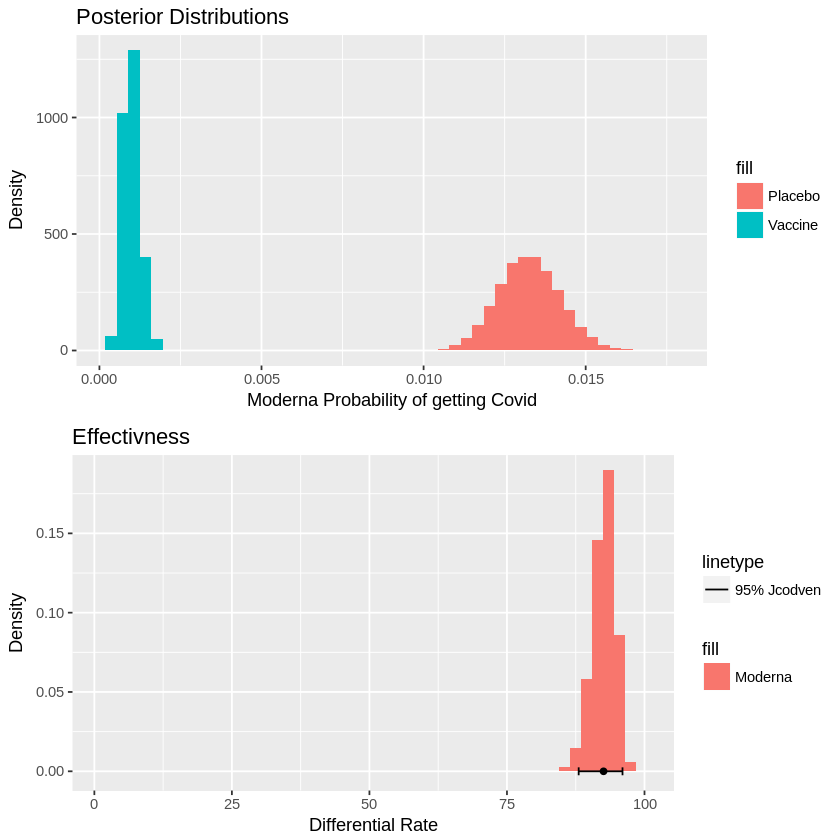

In [51]:
ggplot() +
geom_histogram(aes(x=chain_Moderna.df['theta[1]'], y=..density.., fill='Placebo'), bins=50) +
labs(x='Moderna Probability of getting Covid', y='Density', title='Posterior Distributions')+
geom_histogram(aes(x=chain_Moderna.df['theta[2]'], y=..density.., fill='Vaccine'), bins=50) -> Post.plot

ggplot()+
geom_histogram(aes(x=Moderna_res$diff_rate, y=..density.., fill='Moderna'), bins = 50)+
geom_errorbarh(aes(xmin=lw.Moderna, xmax=up.Moderna, y=0, x=1, linetype='95% Moderna'),  size=0.5, height = .005)+
geom_point(aes(x=mean.Moderna, y= 0))+
labs(x ='Differential Rate', y='Density', title='Effectivness') -> Differential_rate_Moderna

grid.arrange(Post.plot, Differential_rate_Moderna, nrow=2)

## AstraZeneca (Vaxzevria)

Data from EMA

In [20]:
n_vaccine <- 5258
n_placebo <- 5210
patient <- c(rep(" Vaccine ", n_vaccine ),
rep(" Placebo ", n_placebo ))
# Number of patients tested postive after RCT:
p_vaccine <- 64
p_placebo <- 154
tested <- c(rep("Pos", p_vaccine ),
            rep("Neg", n_vaccine - p_vaccine ),
            rep("Pos", p_placebo ),
            rep("Neg", n_placebo - p_placebo ))
AstraZeneca.tb <- tibble( tested = tested , patient = patient )
table( AstraZeneca.tb[[2]], AstraZeneca.tb[[1]])

           
             Neg  Pos
   Placebo  5056  154
   Vaccine  5194   64

JAGS model 

In [21]:
modelString <- "
    model {
        for ( i in 1:Ntot ) {
            tested[i]~dbern( theta[ patient [i]] )
        }
        for ( k in 1: Nclass ) {
            theta[k]~dbeta(3 , 100)
        }
    }"

dataList = list(tested = ifelse(AstraZeneca.tb$tested == "Neg", 0, 1),
                patient = as.integer (factor(AstraZeneca.tb$patient )),
                Ntot = nrow(AstraZeneca.tb),
                Nclass = nlevels(factor(AstraZeneca.tb$patient )))

AstraZeneca_chains <- run.jags(modelString,
                           sample = 15000,
                           n.chains = 4,
                           method = "parallel",
                           monitor = "theta",
                           data = dataList )

Calling 4 simulations using the parallel method...
Following the progress of chain 1 (the program will wait for all chains
to finish before continuing):
Welcome to JAGS 4.1.0 on Wed May 31 14:33:42 2023
JAGS is free software and comes with ABSOLUTELY NO WARRANTY
Loading module: basemod: ok
Loading module: bugs: ok
. . Reading data file data.txt
. Compiling model graph
   Resolving undeclared variables
   Allocating nodes
Graph information:
   Observed stochastic nodes: 10468
   Unobserved stochastic nodes: 2
   Total graph size: 20944
. Reading parameter file inits1.txt
. Initializing model
. Adaptation skipped: model is not in adaptive mode.
. Updating 4000
-------------------------------------------------| 4000
************************************************** 100%
. . Updating 15000
-------------------------------------------------| 15000
************************************************** 100%
. . . . Updating 0
. Deleting model
. 
All chains have finished
Note: the model did not r

In [22]:
summary(AstraZeneca_chains)

,Lower95,Median,Upper95,Mean,SD,Mode,MCerr,MC%ofSD,SSeff,AC.10,psrf
theta[1],0.02510960,0.02948320,0.0341482,0.02954327,0.002318556,NA,1.159278e-05,0.5,40000,-2.968963e-03,1.000074
theta[2],0.00960536,0.01244015,0.0154859,0.01248966,0.001502266,NA,7.574875e-06,0.5,39332,2.659681e-05,1.000164


The vaccine efficancy obtain from a Randomized controlled trials (RCTs) is obtained as the percentile reduction in the frequency of illness among vaccinated peolple compared to people not vaccinated. In this example it is gonna refered as the differential rate.

In [23]:
chain_AstraZeneca.df <- as.data.frame(as.mcmc(AstraZeneca_chains))

#adding the differential rate (the efficancy of the vaccine)
AstraZeneca_res <-  chain_AstraZeneca.df %>% 
                    select('theta[1]','theta[2]') %>%
                    rename ( Placebo = 'theta[1]', Vaccine = 'theta[2]') %>%
                    mutate (diff_rate = (( Placebo - Vaccine ) / Placebo) * 100,
                    Placebo_perc = Placebo * 100,
                    Vaccine_perc = Vaccine * 100)

allmcmc2_AstraZeneca <- as.mcmc(AstraZeneca_res[, 'diff_rate'])
summary(allmcmc2_AstraZeneca)


Iterations = 1:60000
Thinning interval = 1 
Number of chains = 1 
Sample size per chain = 60000 

1. Empirical mean and standard deviation for each variable,
   plus standard error of the mean:

          Mean             SD       Naive SE Time-series SE 
       57.4403         6.1483         0.0251         0.0251 

2. Quantiles for each variable:

 2.5%   25%   50%   75% 97.5% 
44.35 53.55 57.82 61.76 68.37 


In [53]:
mean.AstraZeneca = summary(allmcmc2_AstraZeneca)$statistics[['Mean']]
lw.AstraZeneca = summary(allmcmc2_AstraZeneca)$quantiles[['2.5%']]
up.AstraZeneca = summary(allmcmc2_AstraZeneca)$quantiles[['97.5%']]

Don't know how to automatically pick scale for object of type data.frame. Defaulting to continuous.


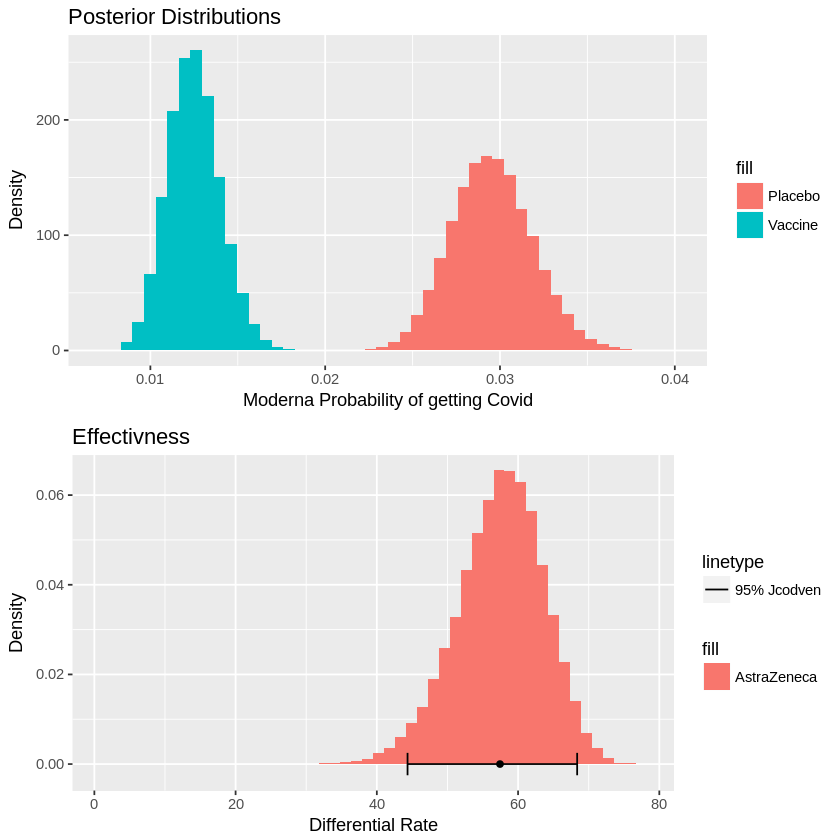

In [54]:
ggplot() +
geom_histogram(aes(x=chain_AstraZeneca.df['theta[1]'], y=..density.., fill='Placebo'), bins=50) +
labs(x='Moderna Probability of getting Covid', y='Density', title='Posterior Distributions')+
geom_histogram(aes(x=chain_AstraZeneca.df['theta[2]'], y=..density.., fill='Vaccine'), bins=50) -> Post.plot

ggplot()+
geom_histogram(aes(x=AstraZeneca_res$diff_rate, y=..density.., fill='AstraZeneca'), bins = 50)+
geom_errorbarh(aes(xmin=lw.AstraZeneca, xmax=up.AstraZeneca, y=0, x=1, linetype='95% AstraZeneca'),  size=0.5, height = .005)+
geom_point(aes(x=mean.AstraZeneca, y= 0))+
labs(x ='Differential Rate', y='Density', title='Effectivness') -> Differential_rate_AstraZeneca

grid.arrange(Post.plot, Differential_rate_AstraZeneca, nrow=2)


## Confronting results for the three vaccine 

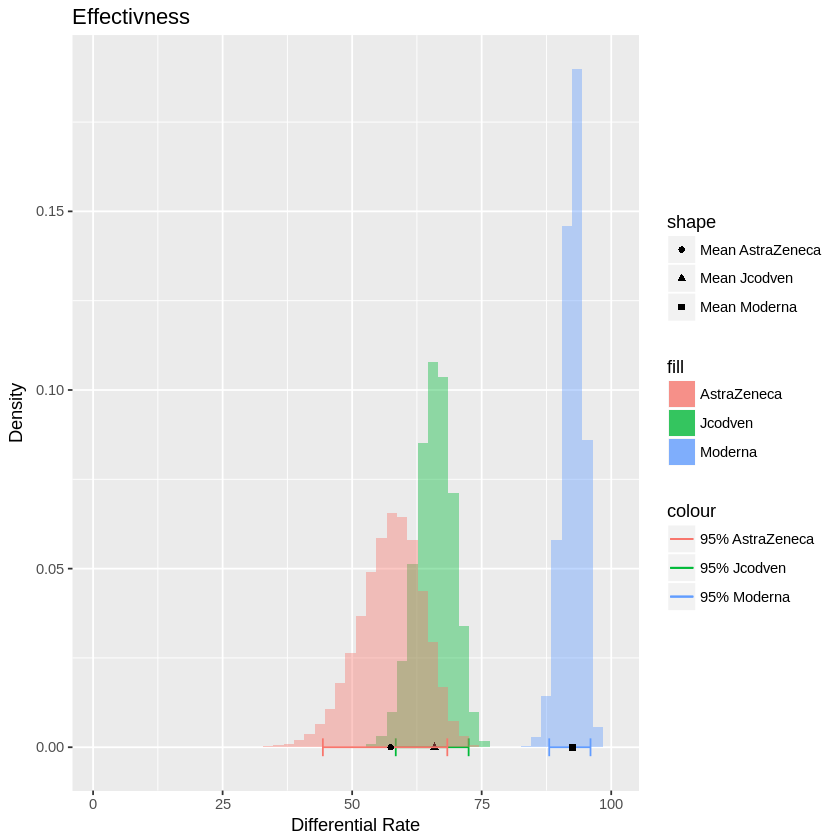

In [69]:
ggplot()+
geom_histogram(aes(x=Jcovden_res$diff_rate, y=..density.., fill='Jcodven'), bins = 50, alpha=0.4)+
geom_errorbarh(aes(xmin=lw.Jcodven, xmax=up.Jcodven, y=0, x=1, color='95% Jcodven'),  size=0.5, height = .005)+
geom_point(aes(x=mean.Jcodven, y= 0, shape = 'Mean Jcodven'))+

geom_histogram(aes(x=Moderna_res$diff_rate, y=..density.., fill='Moderna'), bins = 50, alpha=0.4)+
geom_errorbarh(aes(xmin=lw.Moderna, xmax=up.Moderna, y=0, x=1, color='95% Moderna'),  size=0.5, height = .005)+
geom_point(aes(x=mean.Moderna, y= 0, shape = 'Mean Moderna'))+

geom_histogram(aes(x=AstraZeneca_res$diff_rate, y=..density.., fill='AstraZeneca'), bins = 50, alpha=0.4)+
geom_errorbarh(aes(xmin=lw.AstraZeneca, xmax=up.AstraZeneca, y=0, x=1, color='95% AstraZeneca'),  size=0.5, height = .005)+
geom_point(aes(x=mean.AstraZeneca, y= 0, shape = 'Mean AstraZeneca'))+

labs(x ='Differential Rate', y='Density', title='Effectivness')

# Ex.3 

• according to the official COVID-19 vaccination data, 70% of the world population has received at
least one dose of a COVID-19 vaccine. A global vaccination dataset is available [5]

• the European Centre for Disease Prevention and Control published a downloadable file [6] containing
information on COVID-19 vaccination in the EU/EEA.

• analyze the data and produce the following plots:
- number of vaccinated people (cumulative, daily and week average)
- number of confirmed deaths by COVID-19, both cumulative and weekly average

Importing the data

In [7]:
covid_data <- read_csv('owid-covid-data.csv')

#Dropping Na values
covid_data <- covid_data |>
              drop_na(people_vaccinated) |>
              drop_na(people_fully_vaccinated) |>
              drop_na(total_deaths) |>
              drop_na(new_deaths) |>
              drop_na(new_vaccinations)

#iInspecting columns
str(covid_data)

Rows: 313266 Columns: 67
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr   (4): iso_code, continent, location, tests_units
dbl  (62): total_cases, new_cases, new_cases_smoothed, total_deaths, new_dea...
date  (1): date

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


tibble [50,172 × 67] (S3: tbl_df/tbl/data.frame)
 $ iso_code                                  : chr [1:50172] "AFG" "AFG" "AFG" "AFG" ...
 $ continent                                 : chr [1:50172] "Asia" "Asia" "Asia" "Asia" ...
 $ location                                  : chr [1:50172] "Afghanistan" "Afghanistan" "Afghanistan" "Afghanistan" ...
 $ date                                      : Date[1:50172], format: "2021-05-27" "2021-06-03" ...
 $ total_cases                               : num [1:50172] 68366 75119 160708 178769 196012 ...
 $ new_cases                                 : num [1:50172] 623 1093 456 24 365 ...
 $ new_cases_smoothed                        : num [1:50172] 541.6 964.7 234 36.1 264.1 ...
 $ total_deaths                              : num [1:50172] 2869 3034 7401 7683 7787 ...
 $ new_deaths                                : num [1:50172] 14 27 4 0 0 1 1 1 865 722 ...
 $ new_deaths_smoothed                       : num [1:50172] 13.857 23.571 2.143 0.429 0.714

# Vaccinations

## Cumulative number of vaccinations

In [8]:
covid_data |> 
    group_by(date) |>
    summarize(vaccination_by_day = sum(new_vaccinations), .groups='drop') |>
    mutate(cum_day = cumsum(vaccination_by_day))-> by_day_vaccinated

by_day_vaccinated |> 
ggplot(aes(date, cum_day)) + 
geom_line() +
labs(x='Date', y='Cumulative Number of vaccinated people', title='Cumulative Number of vaccinated people by day') -> plot_cum_by_day

## Average by day and week

In [9]:
covid_data |> 
    group_by(date) |>
    summarize(vaccination_by_day = mean(new_vaccinations), .groups='keep') |> 
    mutate(n_week_year = week(date) + 53*(year(date)-2020)-49) |>
    group_by(n_week_year) |>
    summarize(vaccination_by_week = mean(vaccination_by_day), .groups='drop') -> by_week_vaccinated

by_week_vaccinated |>
    ggplot(aes(n_week_year, vaccination_by_week), size=0.1) + geom_line() +
    labs(x='Week', y='Average Number of vaccinated people', title='Average Number of vaccinated people by week')-> plot_by_week


covid_data |> 
    group_by(date) |>
    summarize(vaccination_by_day = mean(new_vaccinations), .groups='keep') -> by_day_vaccinated

by_day_vaccinated |>
    ggplot(aes(date, vaccination_by_day), size=0.1) + geom_line() +
     labs(x='Days', y='Average Number of vaccinated people', title='Average Number of vaccinated people by day')-> plot_by_day

### Plots

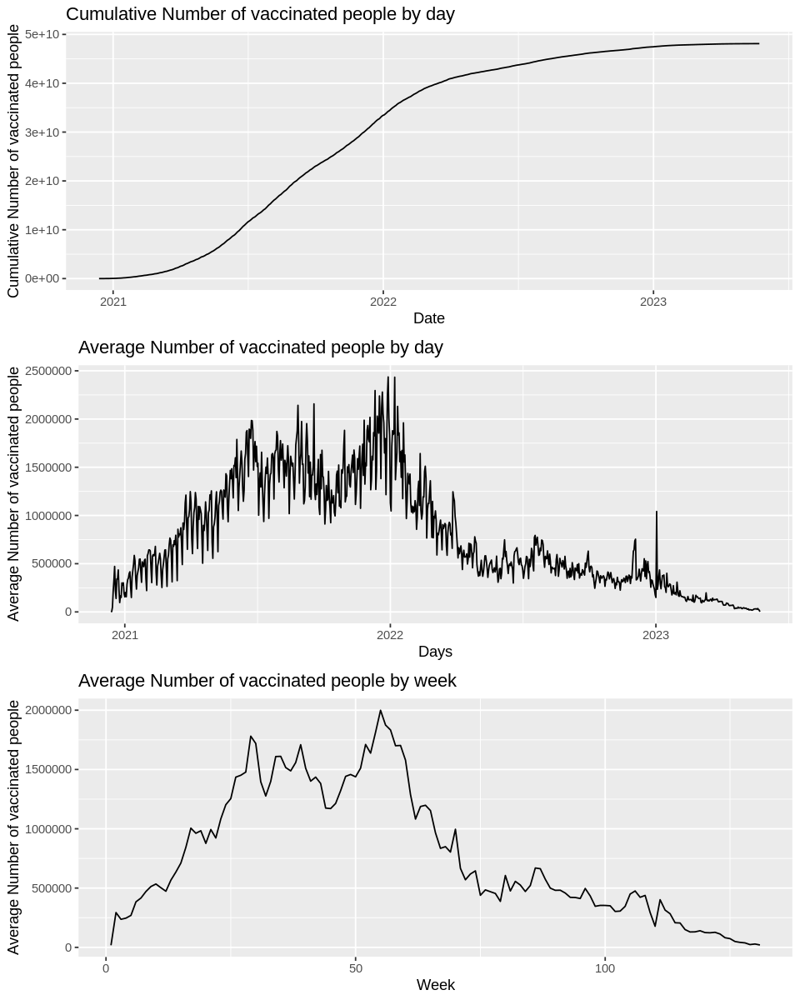

In [10]:
options(repr.plot.width = 8, repr.plot.height=10)
grid.arrange(grobs=list(plot_cum_by_day, plot_by_day, plot_by_week),
             nrow=3)

# Death

## Cumulative day by day

In [14]:
covid_data |> 
    group_by(date) |>
    summarize(deaths_by_day = sum(new_deaths), .groups='drop') |>
    mutate(cum_death_day = cumsum(deaths_by_day))-> by_day_death

by_day_death |> 
ggplot(aes(date, cum_death_day)) + 
geom_line() +
labs(x='Date', y='Cumulative Number of dead people', title='Cumulative Number of Dead People by day') -> plot_cum_death_by_day

##  Average by week

In [15]:
covid_data |> 
    group_by(date) |>
    summarize(deaths_by_day = sum(new_deaths), .groups='keep') |> 
    mutate(n_week_year = week(date) + 53*(year(date)-2020)-49) |>
    group_by(n_week_year) |>
    summarize(deaths_by_week = mean(deaths_by_day), .groups='drop') -> deaths_by_week

deaths_by_week |>
    ggplot(aes(n_week_year, deaths_by_week), size=0.1) + geom_line() +
    labs(x='Week', y='Number of Deaths', title='Average number of deaths pe week')-> plot_death_by_week

### Plots

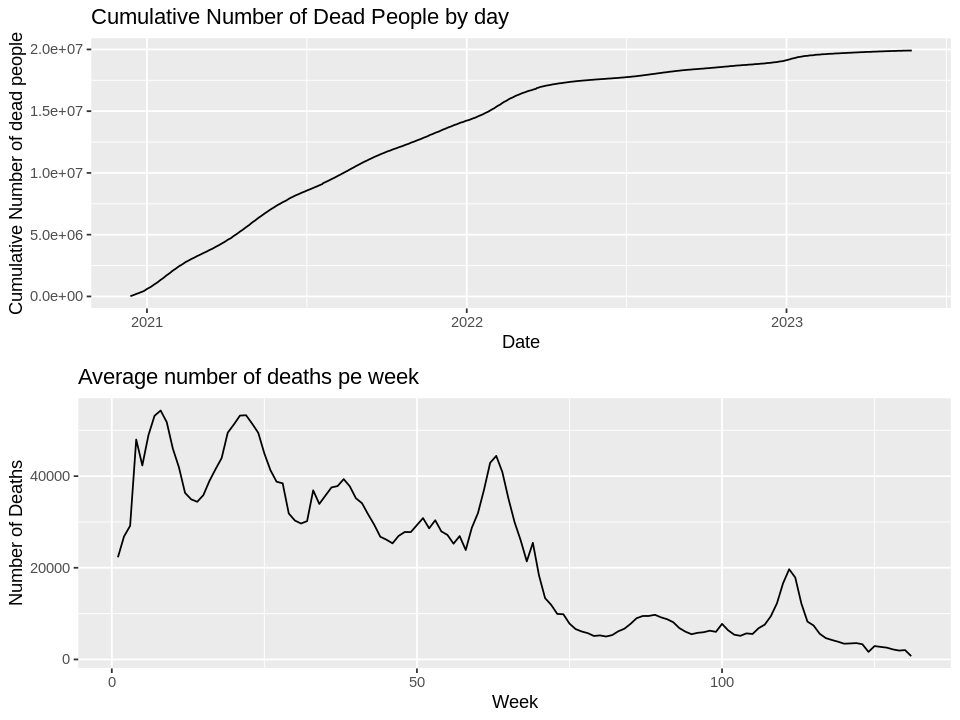

In [16]:
options(repr.plot.width = 8, repr.plot.height=6)
grid.arrange(grobs=list(plot_cum_death_by_day, plot_death_by_week),
             nrow=2)